In [95]:
import cv2
import os
#from torchvision import transforms as T

os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import logging

%matplotlib inline
import matplotlib.pyplot as plt
import pickle
import PIL
import numpy as np
import random
import json

In [236]:
data_train_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/"
label_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_all.txt"
#label_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/val_750.txt"

In [374]:
info_dict = {}

with open(label_path, 'r') as f:
    info = f.readlines()
print("num of image", len(info))

# get dict{label:[path, ..]}  
for idx, person in enumerate(info):
    line = person.split(" ")
    
    i = line[1][:-1]

    if i in info_dict:
        info_dict[i].append(data_train_path + line[0][6:])
    else:
        info_dict[i] = [data_train_path + line[0][6:]]

    
# get person count
person_count = []
person_key = [] # person id which has larger than 2 images
for label, path in info_dict.items():
    if len(path) > 1:
        person_key.append(label)
    if len(path) > 100:
        print(label, len(path))
    person_count.append(len(path))
print("max count: ", max(person_count))
hist,bins = np.histogram(person_count, bins =  [0,1,2,3,4,5,6,7,8,9,10,100])  
print(hist)
print(bins)



num of image 20429
112 150
174 306
383 774
514 122
651 188
760 122
767 1018
968 118
1055 610
1161 113
1273 223
1350 291
1374 731
1477 864
max count:  1018
[   0 1996  737  349  268  165 1137   80    0    0   22]
[  0   1   2   3   4   5   6   7   8   9  10 100]


In [378]:
# split train/val set make query/gallery 
all_image_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_all.txt"
info_dict = {}

with open(all_image_path, 'r') as f:
    info = f.readlines()

# get dict{label:[path, ..]}  
for idx, person in enumerate(info):
    line = person.split(" ")
    
    i = line[1][:-1]

    if i in info_dict:
        info_dict[i].append(person)
    else:
        info_dict[i] = [person]
        
person_key = [] # person id which has larger than 2 images
for label, path in info_dict.items():
    if len(path) > 1 and len(path) < 6:
        person_key.append(label)    

val_set_person = 1348
while True:
    random.shuffle(person_key)
    select_person = person_key[:val_set_person]
    #print(len(select_person))

    query_count = [len(info_dict[i]) for i in select_person]
    #print(sum(query_count))
    if sum(query_count) < 6500: # 选取一部分
        break
print(sum(query_count))
val_query = []


3924


In [382]:
"""
val_query = []
val_gallery = []
train_list = []
query_a_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/query_a_list.txt"
with open(query_a_path, 'r') as f:
    query_a = f.readlines()

gallery_size = 5500
gallery_list = []
query_a_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/gallery_a/"
for i in os.listdir(query_a_path):
    gallery_list.append(query_a_path+i + " -2\n")

for idx, i in enumerate(query_a):
    #path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/" + i.split(" ")[0]
    val_gallery.append("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/" + i)
    if idx > 700:
        break
        

for key in select_person:
    val_query.append(info_dict[key][0])
    if False and len(info_dict[key][1:]) > 2:
        val_gallery.extend(info_dict[key][1:3])
    else:
        val_gallery.extend(info_dict[key][1:])
print("query_imgs: ", len(val_gallery)) 

for i in range(gallery_size-len(val_gallery)):
    val_gallery.append(gallery_list[i])
    
print(len(val_query))
print(idx)
with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/val_query_1348.txt", 'w') as f:
    f.writelines(val_query)
with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/val_gallery_1348.txt", 'w') as f:
    f.writelines(val_gallery)
"""
train_list = []
for key, val in info_dict.items():
    if key in select_person:
        continue
    if len(val) > 1:
        train_list.extend(val)
with open("/world/data-c7/xulie/naic_reid/train_stage1_1348/train_1348_remove1.txt", 'w') as f:
#with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_1348.txt", 'w') as f:
    f.writelines(train_list)

In [355]:
info_dict[select_person[0]]

['/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/584814070.png',
 '/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/449555560.png',
 '/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/256524375.png',
 '/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/18649408.png',
 '/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/854728819.png',
 '/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set//data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_set/597107173.png']

In [216]:
val_lines = []
train_lines = []
train_all = []
for label, path in info_dict.items():
    for p in path:
        lines = p + " " + label + "\n"
        train_all.append(lines)
        if label in select_person:
            val_lines.append(lines)
        else:
            train_lines.append(lines)

val_path =  "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/"+"val_750.txt"
print(val_path)
#with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/"+"val_750.txt", 'w') as f:
#    f.writelines(val_lines)
#with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/"+"train_750.txt", 'w') as f:
#    f.writelines(train_lines)
#with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/"+"train_all.txt", 'w') as f:
#    f.writelines(train_all)

/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/val_750.txt


In [166]:
train_all_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_all.txt"
train_750_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_750.txt"
# "query_a/843519641.png 5194"
query_a_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/query_a_list.txt"
label_list = set()
with open(train_all_path, 'r') as f:
    train_all = f.readlines()
with open(train_750_path, 'r') as f:
    train_750 = f.readlines()
with open(query_a_path, 'r') as f:
    query_a = f.readlines()

In [181]:
#print(len(query_a))
print(train_all[0].split(" ")[1][:-1])
for i in train_all:
    label = i.split(" ")[1][:-1]
    label_list.add(label)
print(len(label_list))

0
4769


In [190]:
query_lines = []
for i in query_a:
    #path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/" + i.split(" ")[0]
    label = i.split(" ")[1][:-1]
    if label in label_list:
        print(label)
    query_lines.append("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/" + i)
train_all.extend(query_lines)
with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_all_query.txt", 'w') as f:
    f.writelines(train_all)


In [191]:
train_750.extend(query_lines)
with open("/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/train_750_query.txt", 'w') as f:
    f.writelines(train_750)

num of image: 731 page size: 10 74


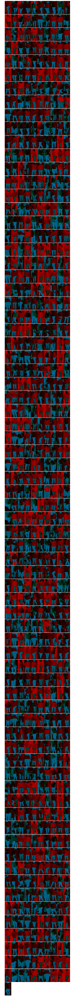

In [108]:
# show images in path_results
def generate_image(path_list):
    h_gap = 5
    v_gap = 20
    text_h = 20
    img_size = (256, 128)
    
    image_col = 10
    image_row = int(np.ceil(len(path_list) / image_col))
    print("num of image:", len(path_list), "page size:", image_col, image_row)
    page = np.ones(((img_size[0] + h_gap)* image_row + h_gap + text_h * 2, (img_size[1] + v_gap) * image_col + v_gap, 3), dtype=np.uint8) * 255
    
    for i, path in enumerate(path_list):
        img = cv2.resize(cv2.imread(path), (img_size[1], img_size[0]))
        
        pt_w = int((i % image_col) * img_size[1] + v_gap)
        pt_h = int(np.floor(i / image_col) * (img_size[0] + h_gap))
        page[pt_h: img_size[0] + pt_h, pt_w :pt_w + img_size[1]] = img
    
    plt.figure(figsize=(image_row*3,image_row*3))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(page, cv2.COLOR_BGR2RGB))
generate_image(info_dict['1374'])    

In [76]:
# split train/val set


['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '15

In [219]:
## view json result
#json_path = "/world/data-c7/xulie/ABD-Net/submit.json"
json_path = "/world/data-c7/xulie/NAIC_ReID/evaluate/submit.json"
with open(json_path, 'r') as f:
    result = json.load(f)
query_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/query_a/"
gallery_path = "/world/data-gpu-112/kebo/datasets/NAIC_ReID/stage1/gallery_a/"

num of image: 30 page size: 10 3


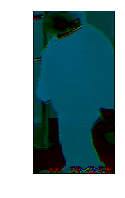

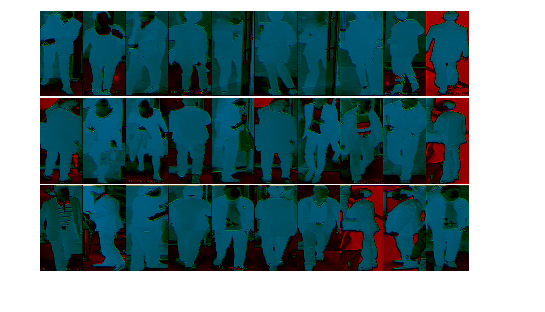

In [225]:
dict_list = list(result.keys())
idx = 5

query_p = query_path + dict_list[idx]
query_img = cv2.imread(query_p)
plt.figure(figsize=(3, 3))
plt.axis('off')
plt.imshow(cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB))

gallery_list = [gallery_path + i for i in result[dict_list[idx]]]
generate_image(gallery_list[:30])

In [122]:
print(query_img[:,:,0])
print(query_img[:,:,1])
print(query_img[:,:,2])
print(np.sum(query_img==0) / np.sum(query_img>=0))

[[ 0 28 54 ... 50 64 43]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[ 98  52  32 ...  31   8   0]
 [168 185 165 ... 161 121   5]
 [155 181 140 ... 136 117   0]
 ...
 [147 171 133 ... 145 123   0]
 [166 168 134 ... 147  78   0]
 [107 185 163 ... 177 182  98]]
0.485992431640625


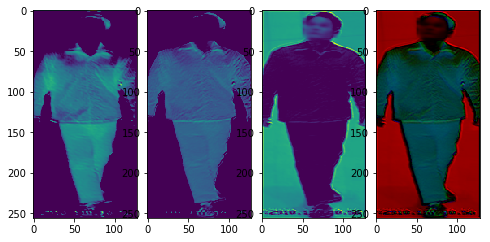

In [125]:
#plt.figure(num='norm',figsize=(8,16)) 
plt.figure(figsize=(8,16)) 
plt.subplots_adjust(wspace=0.1, hspace =0.1)

for i in range(3):
    plt.subplot(1,4,i+1)
    plt.imshow(query_img[:,:,i])
plt.subplot(1,4,4)
plt.imshow(query_img[:,:,::-1])

In [126]:
zero = []
for i in dict_list:
    query_p = query_path + i
    query_img = cv2.imread(query_p)
    zero.append(np.sum(query_img==0) / np.sum(query_img>=0))

In [132]:
print(sum(zero)/len(zero))

0.44824332700403013


In [143]:
sub_working_dir = "/world/data-c7/xulie/naic_output/naic_reid/res101_pcb6*256_bs32/"
files = os.listdir(sub_working_dir)
if 'model_best.pth' in files:
    model_path = os.path.join(sub_working_dir, "model_best.pth")
elif 'model.pth'in files:
    model_path = os.path.join(sub_working_dir, "model.pth")
else:
    raise Exception("Model not found!")
    
params = [i for i in files if 'params' in i]
params.sort()
params_path = os.path.join(sub_working_dir, params[-1])
print(params)

['params.json', 'params_201910311039.json', 'params_201910311047.json', 'params_201910311050.json', 'params_201910311225.json', 'params_201910311238.json']


In [134]:
os.listdir(sub_working_dir)

['params_201910311238.json',
 'model.pth',
 'params_201910311050.json',
 'params_201910311039.json',
 'params_201910311225.json',
 'train_log.log',
 'model_best.pth',
 'params.json',
 'params_201910311047.json',
 'events.out.tfevents.1572496683.gz-cs-gpu-3-96']

In [202]:
from sklearn.metrics.pairwise import euclidean_distances


In [215]:
a = np.array([1.0,2]).reshape(1,-1)
b = np.array([[1.0,2], [3,4]])
dist = euclidean_distances(a, b)
print(dist)
idx = np.argsort(dist[0])
print(idx)

[[0.         2.82842712]]
[0 1]


In [380]:
a = 1
a += 1